#HW1 - Data Exploration and Preparation

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from matplotlib import pylab
params = {'xtick.labelsize': 18,
 'ytick.labelsize': 18,
 'axes.titlesize' : 22,
 'axes.labelsize' : 20,
 'legend.fontsize': 18,
 'legend.title_fontsize': 22,
 'figure.titlesize': 24
 }
pylab.rcParams.update(params)

## Loading the dataset

In [3]:
dataset = pd.read_csv("virus_data.csv")

In [4]:
dataset.shape

(1250, 26)

In [5]:
dataset.num_of_siblings.value_counts()

1    399
2    317
0    271
3    161
4     62
5     31
6      6
7      2
8      1
Name: num_of_siblings, dtype: int64

In [6]:
dataset

,patient_id,age,sex,weight,blood_type,current_location,num_of_siblings,happiness_score,household_income,conversations_per_day,...,PCR_03,PCR_04,PCR_05,PCR_06,PCR_07,PCR_08,PCR_09,PCR_10,spread,risk
0,312,7,F,24.7,A+,"('32.44874', '-99.73314')",2,8,312.3,3,...,159.851645,26.157901,5.694267,9.922768,0.792541,6.606938,2.093085,-36.636500,-1,-1
1,787,21,M,86.3,O-,"('38.07789', '13.44275')",4,6,641.5,1,...,307.760691,362.804629,3.345775,10.055587,-17.976100,8.420971,2.407452,-28.067254,1,1
2,1150,28,M,98.9,O+,"('38.07789', '13.44275')",1,9,864.2,9,...,38.387342,82.544080,8.345576,21.955904,-20.950704,2.668036,3.235283,-63.154721,1,1
3,947,20,F,55.9,O+,"('51.40148', '-1.32471')",3,8,428.3,3,...,70.670443,191.832448,5.840627,1.902177,12.292326,1.448408,1.142477,-29.931566,-1,-1
4,889,44,M,47.2,O+,"('44.27804', '-88.27205')",3,7,371.1,1,...,104.775703,315.286222,6.270290,3.917101,-23.249245,5.782666,-1.987305,-36.738930,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1028,32,F,54.0,O+,"('52.48173', '-2.12139')",1,9,398.6,4,...,230.673964,113.357304,3.546478,9.887626,-15.049791,2.648537,-7.426141,-27.794776,1,1
1246,286,36,M,73.4,A-,"('10.31672', '123.89071')",2,7,563.1,2,...,225.381155,62.891406,3.569395,21.487653,7.043367,4.045632,-9.099876,-39.155421,-1,-1
1247,1493,13,M,45.2,A+,"('25.92493', '73.66633')",1,9,725.4,13,...,144.908625,298.896857,9.801984,16.235470,3.034694,6.521679,6.662441,-65.905576,1,-1
1248,1750,35,M,98.2,O+,"('6.15038', '6.83042')",2,8,935.8,3,...,93.237439,133.925819,7.828380,5.998792,-12.805863,3.337705,-9.397418,-45.601124,1,-1


In [7]:
dataset.columns

Index(['patient_id', 'age', 'sex', 'weight', 'blood_type', 'current_location',
       'num_of_siblings', 'happiness_score', 'household_income',
       'conversations_per_day', 'sugar_levels', 'sport_activity', 'symptoms',
       'pcr_date', 'PCR_01', 'PCR_02', 'PCR_03', 'PCR_04', 'PCR_05', 'PCR_06',
       'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10', 'spread', 'risk'],
      dtype='object')

In [8]:
dataset.pcr_date

0       2020-07-04
1       2020-06-13
2       2020-05-30
3       2020-09-20
4       2020-07-31
           ...    
1245    2020-01-02
1246    2020-08-01
1247    2021-07-19
1248    2020-01-17
1249    2021-05-18
Name: pcr_date, Length: 1250, dtype: object

In [9]:
from pandas.core.common import random_state
import sklearn
from sklearn import model_selection
training_set, test_set = sklearn.model_selection.train_test_split(dataset,test_size = 0.2, random_state = 53)


In [10]:
training_set.shape
test_set.shape

(250, 26)

In [11]:
dataset.size

32500

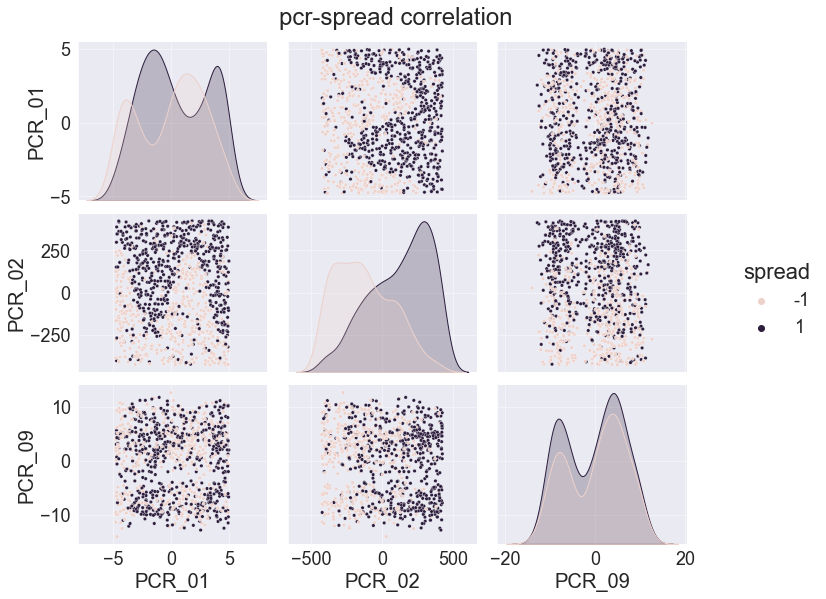

In [12]:
g = sns.pairplot(training_set[["spread", "PCR_01", "PCR_02", "PCR_09"]], plot_kws={"s": 12}, hue = "spread")
g.fig.suptitle("pcr-spread correlation", y=1.04)
for ax in np.ravel(g.axes):
 ax.grid(alpha=0.5)
g.fig.set_size_inches(12,8)

In [13]:
from sklearn.base import BaseEstimator,ClassifierMixin
import scipy
class kNN(BaseEstimator, ClassifierMixin):
  def __init__(self, n_neighbors:int = 3):
    self.n_neighbors = n_neighbors
    self.training_features = []
    self.training_labels = []
  def __call__(self):
    print("i'm called")
  def fit(self, X, y):
    self.training_features = np.copy(X)
    self.training_labels = np.copy(y)
    return self
  def predict(self, X):
# Note: You can use self.n_neighbors here
    dist = scipy.spatial.distance.cdist(X, self.training_features, 'euclidean')
    index_arrays =  np.argpartition(dist, kth=self.n_neighbors)
    k_index_arrays = index_arrays[:,:self.n_neighbors]
    label_arrays = np.take(np.array(self.training_labels), k_index_arrays)
    sum_arrays = np.sum(label_arrays, axis = 1)
    predictions = np.sign(sum_arrays)
 # TODO: compute the predicted labels (+1 or -1)
    return predictions

In [14]:
#import sys
#sys.path.append('/content/visualize_clf.py')
#import visualize_clf

In [15]:
def visualize_clf(clf, X, Y, title, 
                  xlabel, ylabel,
                  marker_size=50,
                  grid_length=300,
                  linewidths=None):
    import matplotlib.pyplot as plt
    import pandas as pd
    from matplotlib.colors import ListedColormap
    
    if isinstance(X, pd.DataFrame):
        X = X.to_numpy()
        
    # For internal use here, make sure labels are 0 and 1
    Y = np.ravel(Y).astype(int)
    labels = set(Y)
    assert len(labels) == 2, "Can only visualize two unique labels"

    if labels == set([-1,1]):
      Y = (Y + 1) // 2
      labels = set(Y)
    
    assert labels == set([0,1]), "Could not handle given labels"

    plt.figure(figsize=(8, 8))

    # Parameters
    n_classes = 2
    markers = ["D", "o"]
    palette = sns.color_palette("hls", 2)
    custom_cmap = ListedColormap(palette.as_hex())

    x_delta = np.abs(X[:, 0].max() - X[:, 0].min()) * 0.1
    y_delta = np.abs(X[:, 1].max() - X[:, 1].min()) * 0.1
    x_min, x_max = X[:, 0].min() - x_delta, X[:, 0].max() + x_delta
    y_min, y_max = X[:, 1].min() - y_delta, X[:, 1].max() + y_delta
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_length),
                         np.linspace(y_min, y_max, grid_length))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    cs = plt.contourf(xx, yy, Z, cmap=custom_cmap, alpha=0.35)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(alpha=0.75)

    # Plot the training points
    for i, color, marker in zip(labels, palette, markers):
        idx = np.where(Y == i)
        plt.scatter(X[idx, 0], X[idx, 1], color=color,
                    marker=marker,
                    edgecolor='white', s=marker_size,
                    linewidths=linewidths)

    plt.title(title, fontsize=20)
    plt.axis("tight")
    plt.show()

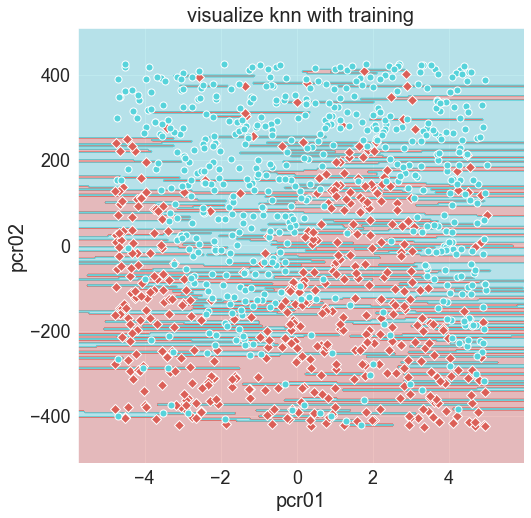

1.0

In [16]:
knn = kNN(1)
df_features = pd.DataFrame(training_set[['PCR_01', 'PCR_02']]).to_numpy()
df_labels = pd.DataFrame(training_set[['spread']]).to_numpy()
knn.fit(df_features, df_labels)
visualize_clf(knn, df_features, df_labels, 'visualize knn with training', 'pcr01', 'pcr02')
knn.score(df_features, df_labels)

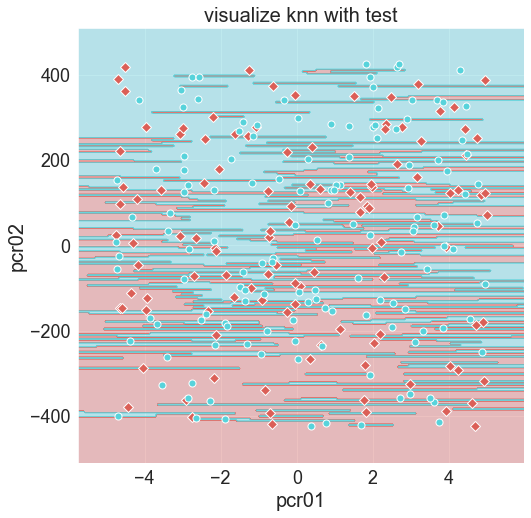

0.72

In [17]:
df_test_features = pd.DataFrame(test_set[['PCR_01', 'PCR_02']]).to_numpy()
df_test_labels = pd.DataFrame(test_set[['spread']]).to_numpy()
visualize_clf(knn, df_features, df_test_labels, 'visualize knn with test', 'pcr01', 'pcr02')
knn.score(df_test_features, df_test_labels)

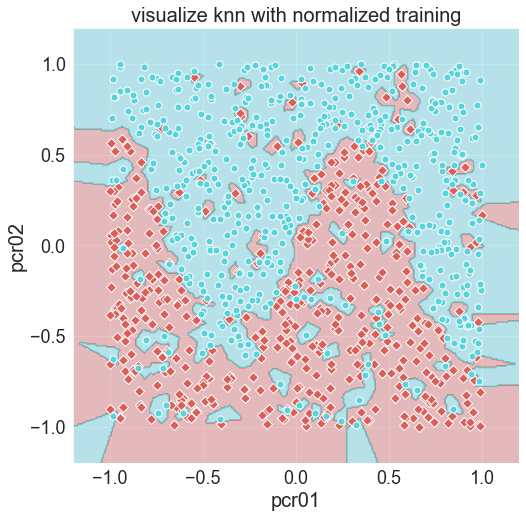

1.0

In [18]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler((-1,1))
scaler.fit(df_features)
normalaized_set = scaler.transform(df_features)
knn.fit(normalaized_set, df_labels)
visualize_clf(knn, normalaized_set, df_labels, 'visualize knn with normalized training', 'pcr01', 'pcr02')
knn.score(normalaized_set, df_labels)

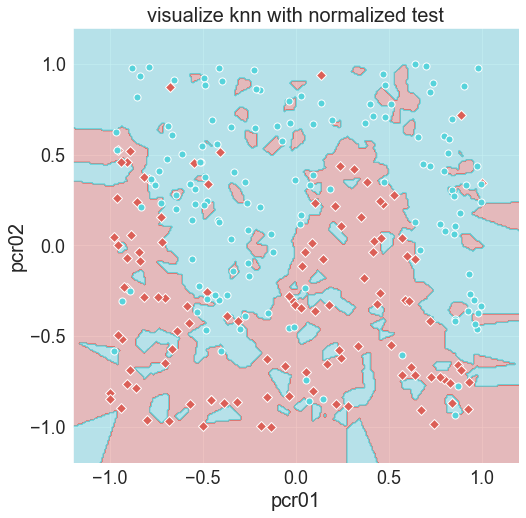

0.8

In [19]:
scaler.fit(df_test_features)
normalaized_test_set = scaler.transform(df_test_features)
visualize_clf(knn, normalaized_test_set, df_test_labels, 'visualize knn with normalized test', 'pcr01', 'pcr02')
knn.score(normalaized_test_set, df_test_labels)

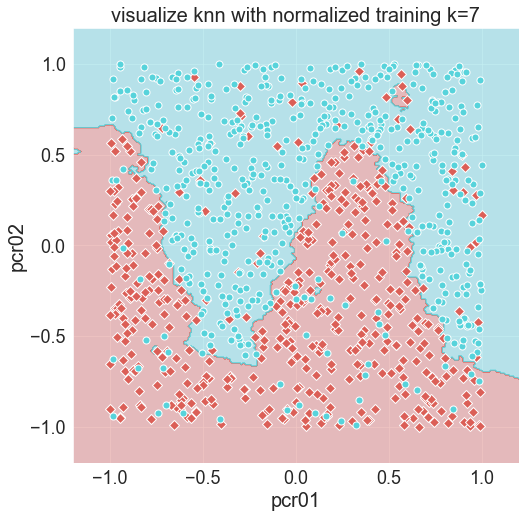

0.888

In [20]:
knn = kNN(7)
knn.fit(normalaized_set, df_labels)
visualize_clf(knn, normalaized_set, df_labels, 'visualize knn with normalized training k=7', 'pcr01', 'pcr02')
knn.score(normalaized_set, df_labels)

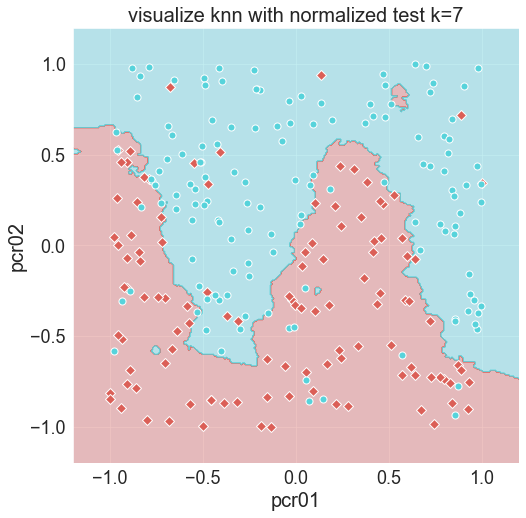

0.86

In [21]:
visualize_clf(knn, normalaized_test_set, df_test_labels, 'visualize knn with normalized test k=7', 'pcr01', 'pcr02')
knn.score(normalaized_test_set, df_test_labels)

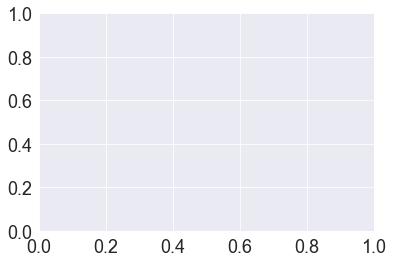

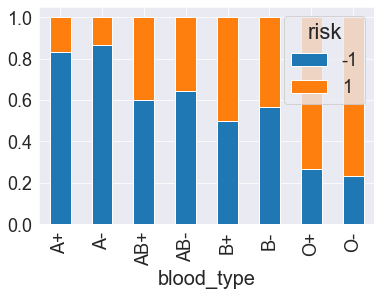

In [22]:
fig, ax = plt.subplots(sharey = False)
_ = pd.crosstab(training_set['blood_type'], training_set['risk'], normalize="index").plot(kind = 'bar', stacked = True)

In [23]:
dataset['A'] = dataset["blood_type"].isin(["A+", "A-"]).apply(lambda x: int(x))
dataset['B'] = dataset["blood_type"].isin(["B+", "B-", "AB+", "AB-"]).apply(lambda x: int(x))
dataset['O'] = dataset["blood_type"].isin(["O+", "O-"]).apply(lambda x: int(x))
dataset = dataset.drop('blood_type', 1)

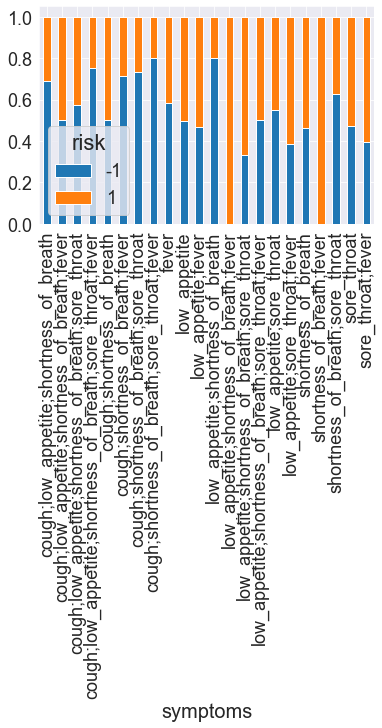

In [24]:
dataset['symptoms'].value_counts()
_ = pd.crosstab(training_set['symptoms'], training_set['risk'], normalize="index").plot(kind = 'bar', stacked = True)

In [25]:
dataset["low_appetite"] = dataset["symptoms"].str.contains("low_appetite").fillna(value = False).apply(lambda x: int(x))
dataset["cough"] = dataset["symptoms"].str.contains("cough").fillna(value = False).apply(lambda x: int(x))
dataset["shortness_of_breath"] = dataset["symptoms"].str.contains("shortness_of_breath").fillna(value = False).apply(lambda x: int(x))
dataset["fever"] = dataset["symptoms"].str.contains("fever").fillna(value = False).apply(lambda x: int(x))
dataset["sore_throat"] = dataset["symptoms"].str.contains("sore_throat").fillna(value = False).apply(lambda x: int(x))
dataset = dataset.drop('symptoms', 1)

In [26]:
#change current location to 2 different features
dataset["current_location_x"] = dataset["current_location"].apply(lambda x: (x.split(","))[0][2:-1])
dataset["current_location_y"] = dataset["current_location"].apply(lambda x: (x.split(","))[1][2:-2])
dataset = dataset.drop('current_location', 1)

In [28]:
#change date to numeric
import datetime
dataset["time_stamp_pcr"] = dataset["pcr_date"].apply(lambda x: (datetime.datetime(int(x[0:4]),int(x[5:7]),int(x[8:10]),0,0) - datetime.datetime(1970,1,1)).total_seconds())
dataset = dataset.drop('pcr_date', 1)

In [29]:
dataset

,patient_id,age,sex,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
0,312,7,F,24.7,2,8,312.3,3,79,1,...,0,0,1,0,0,0,1,32.44874,-99.73314,1.593821e+09
1,787,21,M,86.3,4,6,641.5,1,84,2,...,0,1,1,0,0,0,0,38.07789,13.44275,1.592006e+09
2,1150,28,M,98.9,1,9,864.2,9,113,0,...,0,1,0,0,0,0,0,38.07789,13.44275,1.590797e+09
3,947,20,F,55.9,3,8,428.3,3,95,3,...,0,1,0,0,0,0,0,51.40148,-1.32471,1.600560e+09
4,889,44,M,47.2,3,7,371.1,1,43,3,...,0,1,0,0,0,0,1,44.27804,-88.27205,1.596154e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1028,32,F,54.0,1,9,398.6,4,81,1,...,0,1,1,0,0,0,0,52.48173,-2.12139,1.577923e+09
1246,286,36,M,73.4,2,7,563.1,2,75,0,...,0,0,0,0,0,0,0,10.31672,123.89071,1.596240e+09
1247,1493,13,M,45.2,1,9,725.4,13,102,1,...,0,0,1,0,1,0,0,25.92493,73.66633,1.626653e+09
1248,1750,35,M,98.2,2,8,935.8,3,110,3,...,0,1,0,0,0,0,1,6.15038,6.83042,1.579219e+09


In [30]:
dataset

,patient_id,age,sex,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
0,312,7,F,24.7,2,8,312.3,3,79,1,...,0,0,1,0,0,0,1,32.44874,-99.73314,1.593821e+09
1,787,21,M,86.3,4,6,641.5,1,84,2,...,0,1,1,0,0,0,0,38.07789,13.44275,1.592006e+09
2,1150,28,M,98.9,1,9,864.2,9,113,0,...,0,1,0,0,0,0,0,38.07789,13.44275,1.590797e+09
3,947,20,F,55.9,3,8,428.3,3,95,3,...,0,1,0,0,0,0,0,51.40148,-1.32471,1.600560e+09
4,889,44,M,47.2,3,7,371.1,1,43,3,...,0,1,0,0,0,0,1,44.27804,-88.27205,1.596154e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1245,1028,32,F,54.0,1,9,398.6,4,81,1,...,0,1,1,0,0,0,0,52.48173,-2.12139,1.577923e+09
1246,286,36,M,73.4,2,7,563.1,2,75,0,...,0,0,0,0,0,0,0,10.31672,123.89071,1.596240e+09
1247,1493,13,M,45.2,1,9,725.4,13,102,1,...,0,0,1,0,1,0,0,25.92493,73.66633,1.626653e+09
1248,1750,35,M,98.2,2,8,935.8,3,110,3,...,0,1,0,0,0,0,1,6.15038,6.83042,1.579219e+09


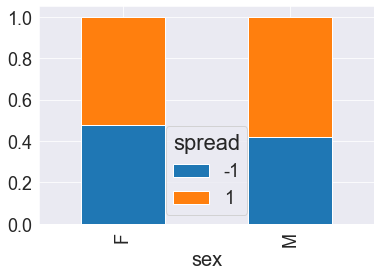

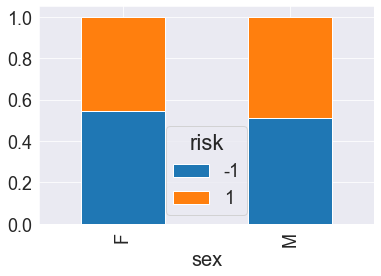

In [31]:
_ = pd.crosstab(training_set['sex'], training_set['spread'], normalize="index").plot(kind = 'bar', stacked = True)
_ = pd.crosstab(training_set['sex'], training_set['risk'], normalize="index").plot(kind = 'bar', stacked = True)
dataset = dataset.drop('sex', 1)

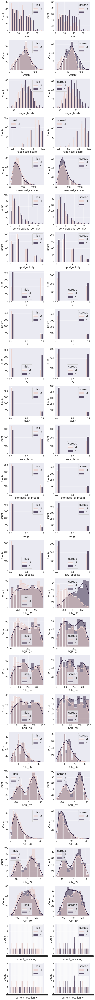

In [32]:
training_set, test_set = sklearn.model_selection.train_test_split(dataset,test_size = 0.2, random_state = 53)
COL_NAME = ['age', 'weight','sugar_levels', 'happiness_score', 'household_income', 'conversations_per_day', 'sport_activity', 'A', 'B', 'O', 'fever', 'sore_throat', 'shortness_of_breath', 'cough', 'low_appetite','PCR_02', 'PCR_03', 'PCR_04', 'PCR_05', 'PCR_06', 'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10', 'current_location_x', 'current_location_y']
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
 column = COL_NAME[row]
 for j, cls in enumerate(["risk", "spread"]):
    plt.subplot(ROWS,COLS, row * COLS + 1 + j)
    isContinuous = "float" in training_set[column].dtype.name
    sns.histplot(data=training_set, x=column, hue=cls, line_kws={"linewidth": 3},
    kde=isContinuous, multiple="layer" if isContinuous else "dodge")
    plt.grid(alpha=0.5)
plt.tight_layout()

In [33]:
s = training_set.corr().risk.abs()
s.sort_values(kind="quicksort", ascending=False)

risk                     1.000000
A                        0.491772
O                        0.487258
cough                    0.072468
weight                   0.071977
shortness_of_breath      0.062346
PCR_06                   0.056947
PCR_01                   0.055184
PCR_03                   0.054455
spread                   0.052225
sugar_levels             0.051584
age                      0.045568
PCR_09                   0.042105
patient_id               0.039829
household_income         0.032662
conversations_per_day    0.027912
num_of_siblings          0.027084
PCR_05                   0.023388
sport_activity           0.020900
sore_throat              0.015288
PCR_08                   0.015192
PCR_04                   0.013901
fever                    0.013767
time_stamp_pcr           0.010191
low_appetite             0.007941
B                        0.006199
happiness_score          0.005903
PCR_10                   0.004918
PCR_02                   0.004824
PCR_07        

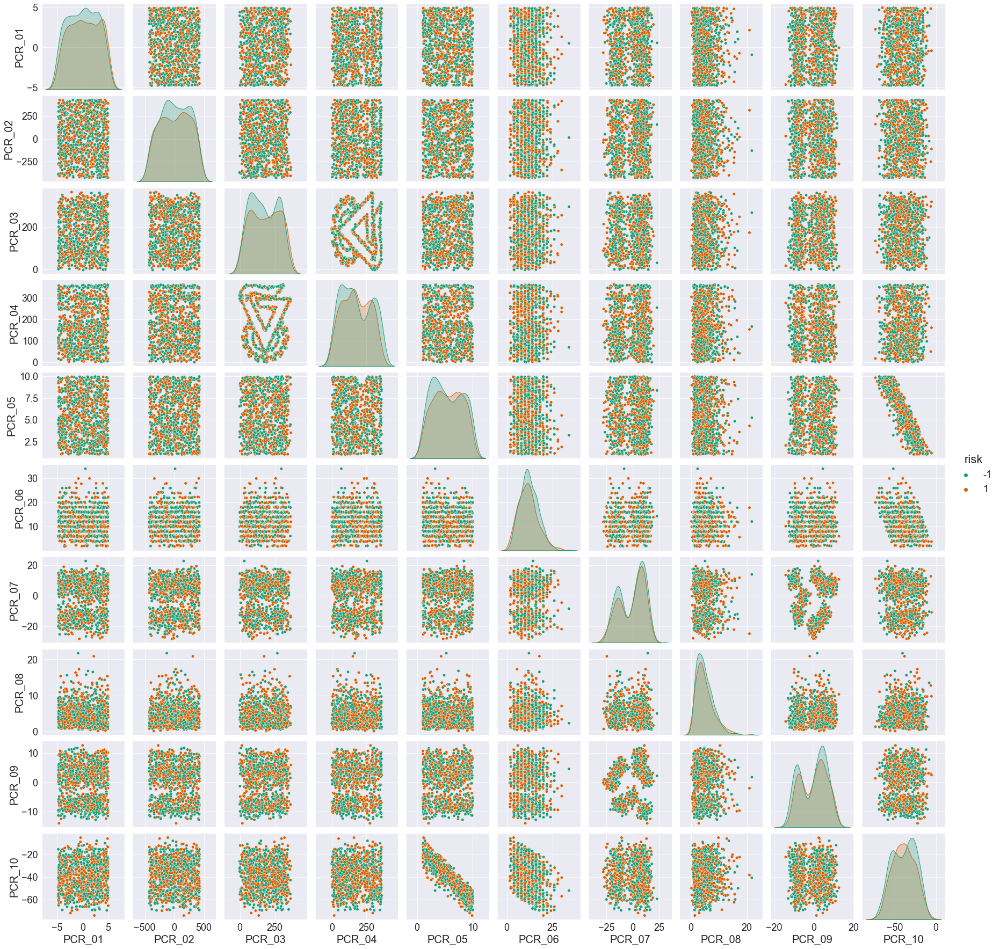

In [34]:
# sns.pairplot(training_set[training_set.filter(like='PCR').columns.tolist() + ["risk"]],
#  plot_kws={"s": 30}, hue="risk", palette='Dark2')

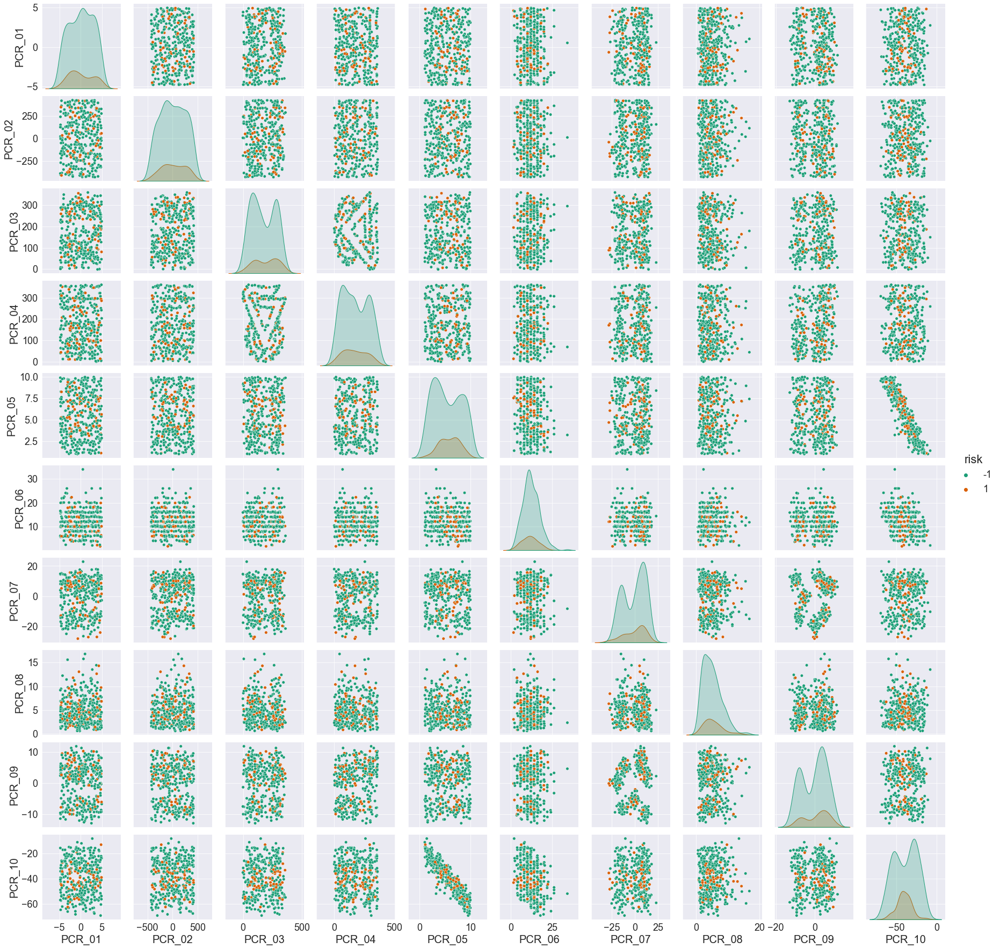

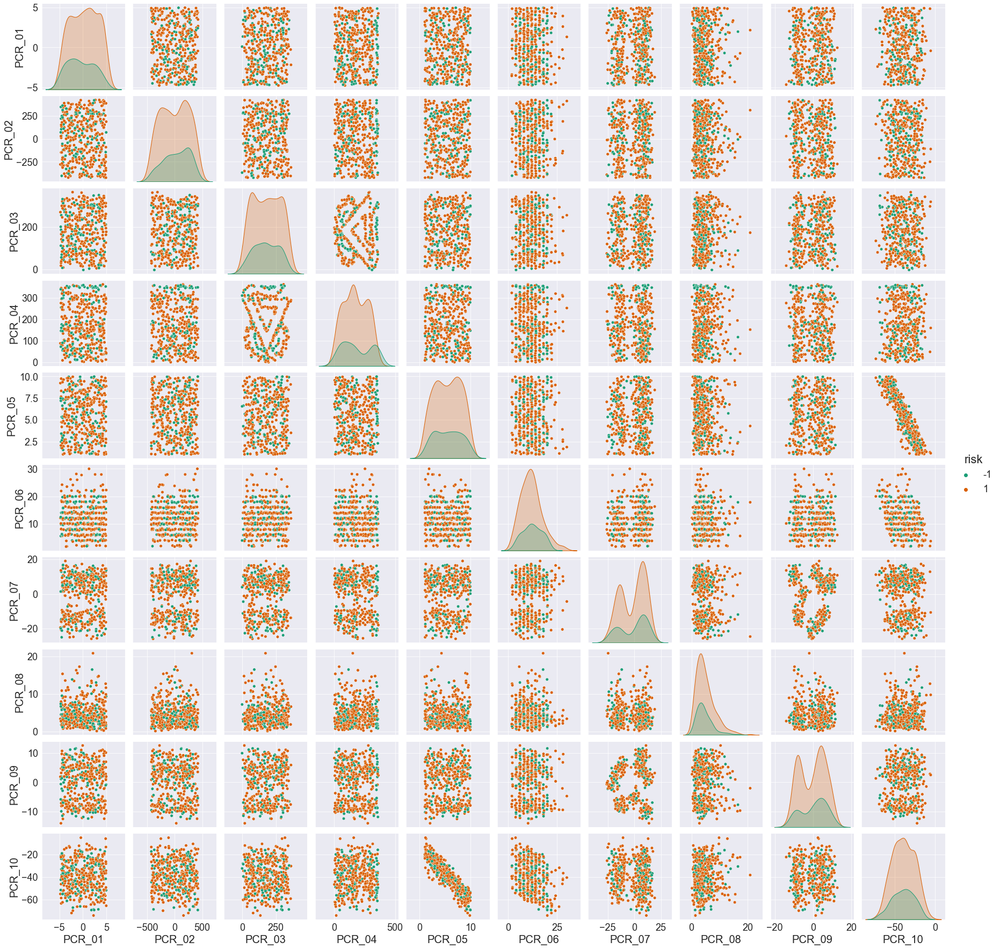

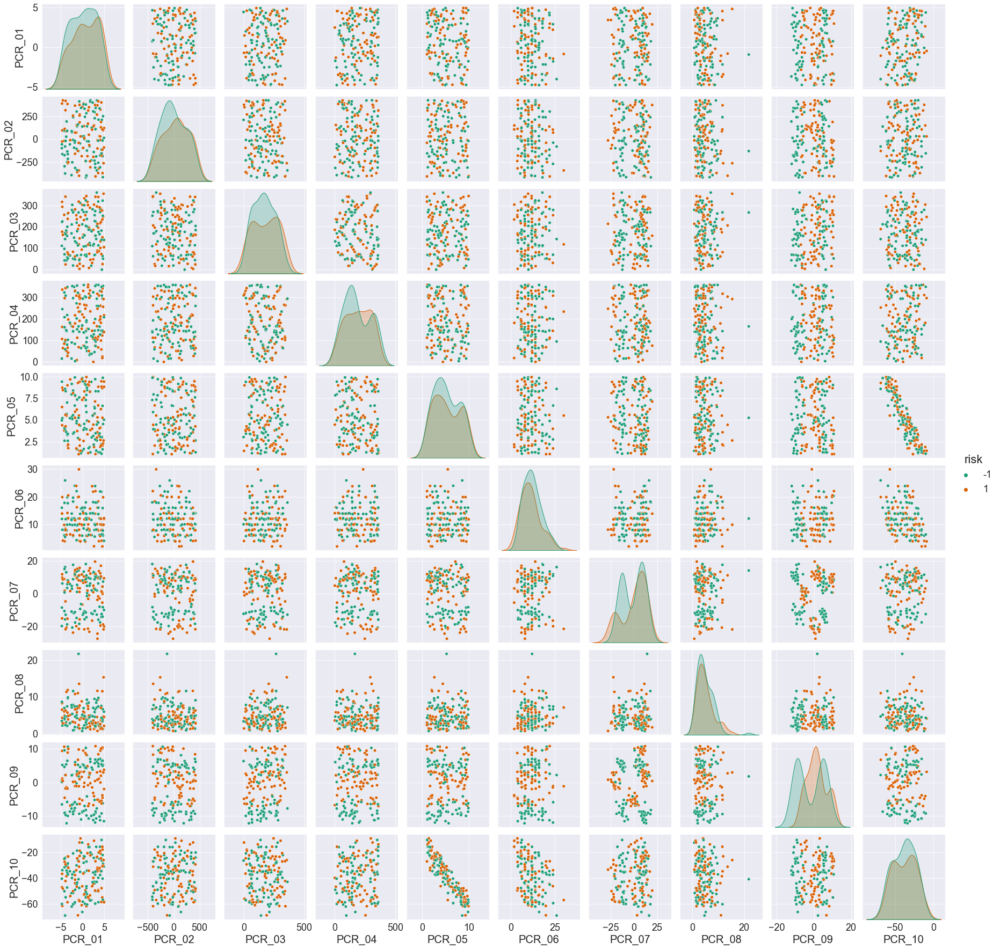

In [35]:

# A_df = training_set[training_set['A'] == 1]
# B_df = training_set[training_set['B'] == 1]
# O_df = training_set[training_set['O'] == 1]
#
# sns.pairplot(A_df[B_df.filter(like='PCR').columns.tolist() + ["risk"]],
#  plot_kws={"s": 30}, hue="risk", palette='Dark2')
#
# sns.pairplot(O_df[B_df.filter(like='PCR').columns.tolist() + ["risk"]],
#  plot_kws={"s": 30}, hue="risk", palette='Dark2')
#
# sns.pairplot(B_df[B_df.filter(like='PCR').columns.tolist() + ["risk"]],
#  plot_kws={"s": 30}, hue="risk", palette='Dark2')

Text(0.5, 0.98, 'Blood group O')

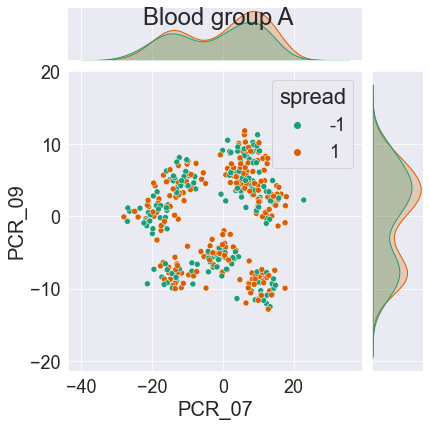

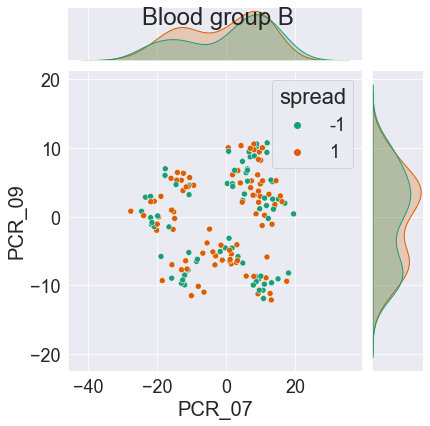

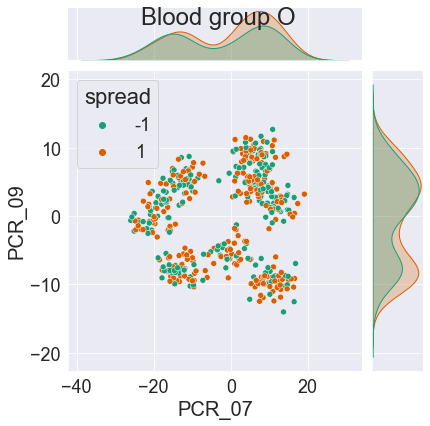

In [36]:
p_A = sns.jointplot(data=A_df, x='PCR_07', y='PCR_09', hue='spread', palette = "Dark2")
p_A.fig.suptitle("Blood group A")
p_B = sns.jointplot(data=B_df, x='PCR_07', y='PCR_09', hue='spread', palette = "Dark2")
p_B.fig.suptitle("Blood group B")
p_O = sns.jointplot(data=O_df, x='PCR_07', y='PCR_09', hue='spread', palette = "Dark2")
p_O.fig.suptitle("Blood group O")

Text(0.5, 0.98, 'Blood group O')

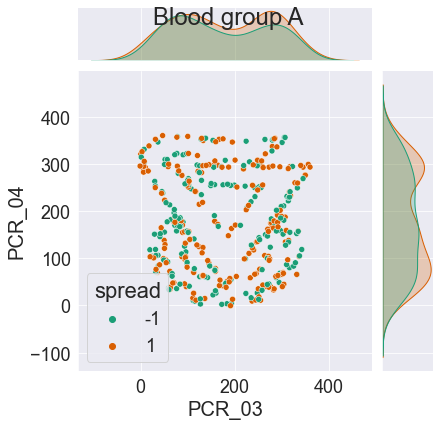

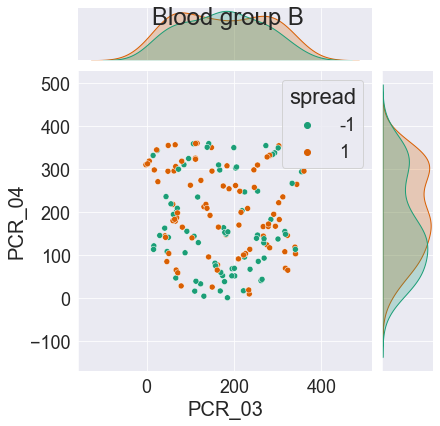

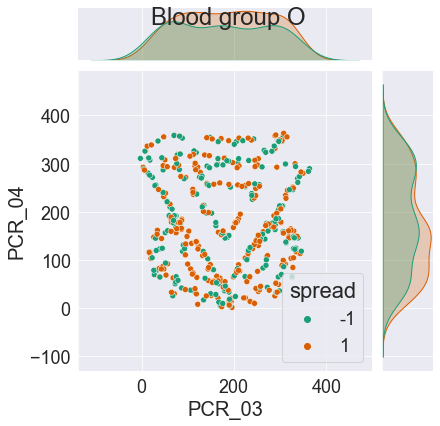

In [37]:
p_A = sns.jointplot(data=A_df, x='PCR_03', y='PCR_04', hue='spread', palette = "Dark2")
p_A.fig.suptitle("Blood group A")
p_B = sns.jointplot(data=B_df, x='PCR_03', y='PCR_04', hue='spread', palette = "Dark2")
p_B.fig.suptitle("Blood group B")
p_O = sns.jointplot(data=O_df, x='PCR_03', y='PCR_04', hue='spread', palette = "Dark2")
p_O.fig.suptitle("Blood group O")

In [39]:
def minMaxNormal(feature):
  df = training_set[[feature]]
  scaler = MinMaxScaler((-1,1))
  scaler.fit(df)
  normalaized = scaler.transform(df)
  training_set[feature] = normalaized

In [40]:
from sklearn.preprocessing import StandardScaler
def stdNormal(feature):
  df = training_set[[feature]]
  scaler = StandardScaler()
  scaler.fit(df)
  normalaized = scaler.transform(df)
  training_set[feature] = normalaized

In [43]:
stdNormal("weight")

<ipython-input-40-0ba7932d7f9b>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [44]:
minMaxNormal("age")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [45]:
minMaxNormal("num_of_siblings")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [46]:
minMaxNormal("happiness_score")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [47]:
minMaxNormal("household_income")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [48]:
minMaxNormal("conversations_per_day")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [49]:
stdNormal("sugar_levels")

<ipython-input-40-0ba7932d7f9b>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [50]:
minMaxNormal("sport_activity")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [51]:
for i in range(1,10):
    if i != 6:
        minMaxNormal("PCR_0"+str(i))
stdNormal("PCR_06")
stdNormal("PCR_10")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized
<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized
<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

In [52]:
minMaxNormal("current_location_x")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [53]:
minMaxNormal("current_location_y")

<ipython-input-39-7abd5b4fd2c6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [60]:
minMaxNormal("time_stamp_pcr")

C:\Users\97254\AppData\Local\Temp/ipykernel_3328/338530222.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  training_set[feature] = normalaized


In [61]:
training_set

,patient_id,age,weight,num_of_siblings,happiness_score,household_income,conversations_per_day,sugar_levels,sport_activity,PCR_01,...,B,O,low_appetite,cough,shortness_of_breath,fever,sore_throat,current_location_x,current_location_y,time_stamp_pcr
265,429,-0.420290,1.245297,-0.50,1.00,-0.854249,-0.555556,0.365061,-0.5,-0.563842,...,0,1,1,0,0,0,0,0.690796,-0.051275,-0.939560
336,1306,-0.652174,-1.341621,-1.00,0.50,-0.299200,-0.777778,-2.553730,1.0,0.978077,...,0,1,0,0,0,0,1,0.759804,-0.058788,-0.458791
589,1485,-0.420290,0.746067,-0.50,0.25,-0.821437,-0.666667,1.108026,-1.0,-0.402281,...,0,1,0,0,0,0,0,0.744665,-0.056790,0.538462
532,102,0.072464,0.237760,-1.00,0.75,-0.515734,-0.111111,0.524268,0.0,-0.995722,...,0,0,1,0,0,0,0,0.599250,0.797250,-0.747253
1009,1349,0.188406,0.092530,-0.75,1.00,-0.723223,0.111111,-1.439282,0.0,-0.287737,...,0,1,0,0,0,1,0,0.429886,0.753872,-0.230769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
662,1064,-0.536232,0.283145,-0.50,1.00,-0.835638,-0.888889,-1.492351,-0.5,-0.817210,...,1,0,0,0,0,0,1,0.566143,0.063160,0.472527
1213,1466,0.188406,0.587221,-0.75,0.75,-0.341879,-0.333333,-0.908593,-0.5,0.500060,...,0,0,1,0,0,0,1,0.345819,-0.603158,0.659341
421,54,-0.594203,-0.547392,-1.00,0.25,-0.532925,-0.666667,0.205854,0.5,-0.110783,...,0,1,0,0,0,0,0,0.409800,0.379960,0.870879
885,1572,-1.000000,-2.376388,-0.75,0.50,-0.935122,-1.000000,-2.182248,-0.5,0.874556,...,1,0,0,1,1,1,0,0.561673,-0.579265,0.120879


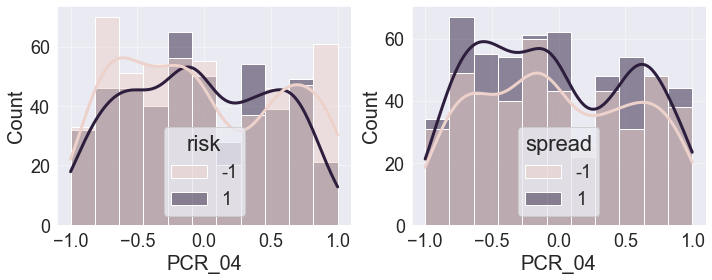

In [54]:
COL_NAME = ['PCR_04']
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
 column = COL_NAME[row]
 for j, cls in enumerate(["risk", "spread"]):
    plt.subplot(ROWS,COLS, row * COLS + 1 + j)
    isContinuous = "float" in training_set[column].dtype.name
    sns.histplot(data=training_set, x=column, hue=cls, line_kws={"linewidth": 3},
    kde=isContinuous, multiple="layer" if isContinuous else "dodge")
    plt.grid(alpha=0.5)
plt.tight_layout()

In [63]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
sfs = SequentialFeatureSelector(knn, n_features_to_select=3)
train_feature = training_set.drop(["spread", "risk"], axis=1)
sfs.fit(train_feature, np.ravel(training_set[["spread"]]) )
SequentialFeatureSelector(estimator=KNeighborsClassifier(n_neighbors=5),
                          n_features_to_select=3)
sfs.get_support()

array([False, False,  True, False, False, False, False, False, False,
        True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [66]:
train_feature.columns

Index(['patient_id', 'age', 'weight', 'num_of_siblings', 'happiness_score',
       'household_income', 'conversations_per_day', 'sugar_levels',
       'sport_activity', 'PCR_01', 'PCR_02', 'PCR_03', 'PCR_04', 'PCR_05',
       'PCR_06', 'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10', 'A', 'B', 'O',
       'low_appetite', 'cough', 'shortness_of_breath', 'fever', 'sore_throat',
       'current_location_x', 'current_location_y', 'time_stamp_pcr'],
      dtype='object')

In [ ]:
# from google.colab import files
# outputPath = "saved_file.csv"
# dataset.to_csv(outputPath)
# files.download(outputPath)